<a href="https://colab.research.google.com/github/ACTCollaboration/DR6_Notebooks/blob/main/ACT_DR6_ymap_stacking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Visualizing and stacking galaxy clusters in the ACT DR6 Compton $y$ map**


*Written by Martine Lokken and the ACT collaboration*


**1. Data: y map**

The DR6 y map is presented in Coulton et al. 2023, [on arXiv](https://https://arxiv.org/abs/2307.01258).
The map, beam, and mask are available on [LAMBDA](https://lambda.gsfc.nasa.gov/product/act/actadv_dr6_compton_maps_get.html).


The map is ~13,000 square degrees of combined data from ACT and Planck, using a needlet internal linear combination (ILC) technique adept at minimizing Galactic contamination and handling spatially-varying noise. The map power spectrum is noise-dominated at nearly all scales but improves upon the Planck-only y map noise at all scales. Nevertheless, many massive galaxy clusters are visible by-eye. Less massive clusters need to be stacked to be distinguishable from the noise. This notebook shows how to take cutouts of the map around clusters and stack them.


The y map used in this notebook is the standard map from the data release, with the following properties:
*   No deprojected components (likely to have some CIB and CMB contamination)
*   1.6' effective beam
*   0.5' pixels

There are many related maps and products available at [this url](https://portal.nersc.gov/project/act/dr6_nilc/ymaps_20230220/). This includes a suite of CIB-deprojected maps. The effects in these maps and suggestions for how to incorporate them into your analysis are described in a companion notebook, called ACT_DR6_ymap_CIB.

See the [DR4/5 notebooks](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/blob/master/Notebooks/Section_5_Lensing_maps.ipynb) for more examples of manipulating ACT data.

In [1]:
# Option 1: Run this notebook with the full maps
!wget -c -O ilc_SZ_yy.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/ilc_SZ_yy.fits # get the file and rename it for consistency with the filenames on Lambda
!wget -c -O wide_mask_GAL070_apod_1.50_deg_wExtended.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/wide_mask_GAL070_apod_1.50_deg_wExtended.fits

# Option 2: Run this notebook with downgraded maps (will take less RAM in Collab) -- uncomment the following lines
# !wget -c -O ilc_SZ_yy.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/downgraded10_ilc_SZ_yy.fits # get the file and rename it for consistency with the filenames on Lambda
# !wget -c -O wide_mask_GAL070_apod_1.50_deg_wExtended.fits https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/downgraded10_outputMask_wide_mask_GAL070_apod_1.50_deg_wExtended.fits

# Option 3:
# Go to LAMBDA, https://lambda.gsfc.nasa.gov/product/act/actadv_dr6_compton_maps_get.html
# Download ilc_SZ_yy.fits and wide_mask_GAL070_apod_1.50_deg_wExtended.fits to your computer
# After downloading, go to Files --> Upload on the left side of Colab, and upload the files to this working session

# Option 4:
# Add the Option 3 files to your Google Drive, then uncomment and run the following lines:
# from google.colab import drive
# drive.mount('/content/drive')


--2024-04-18 13:02:34--  https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/ilc_SZ_yy.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

--2024-04-18 13:02:35--  https://phy-act1.princeton.edu/public/data/dr6_ilc_v1/wide_mask_GAL070_apod_1.50_deg_wExtended.fits
Resolving phy-act1.princeton.edu (phy-act1.princeton.edu)... 128.112.102.238
Connecting to phy-act1.princeton.edu (phy-act1.princeton.edu)|128.112.102.238|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.



**2. Loading the Data Product**
The next section reads in the y map. To do so, we need to install and import the `pixell` package.

These [pixell tutorials](https://github.com/simonsobs/pixell_tutorials) provide further examples of map manipulation with `pixell`.

In [2]:
# Install pixell
!pip install pixell
# later on, we will also use pillow for some image manipulation
!pip install pillow

In [3]:
# Import some neccesary packages
from pixell import enmap, enplot, utils, reproject
from astropy.io import fits
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick


In [4]:
# gdrive_path = "/content/drive/MyDrive/path_to_maps/" # only needed if you are loading the maps in from your Google Drive

# load the ymap as an 'enmap' object
ymap = enmap.read_map("ilc_SZ_yy.fits") # put gdrive_path + "ilc_SZ_yy.fits" if you are using Drive

# Load the mask
mask = enmap.read_map("wide_mask_GAL070_apod_1.50_deg_wExtended.fits")

Let's take a look at the y map. It is currently in CAR format (Cartesian geometry) with equally-shaped pixels, which causes shape distortion near the poles. In the plot below, we will see it as a visual stretching of the data as we move lower in declination toward the south pole. If you want to convert the map to Healpix, there are examples of reprojection routines in the [this notebook](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/blob/master/Notebooks/Section_3_HEALPix_CAR_Conversions.ipynb) from the set of ACT DR4-DR5 notebooks.

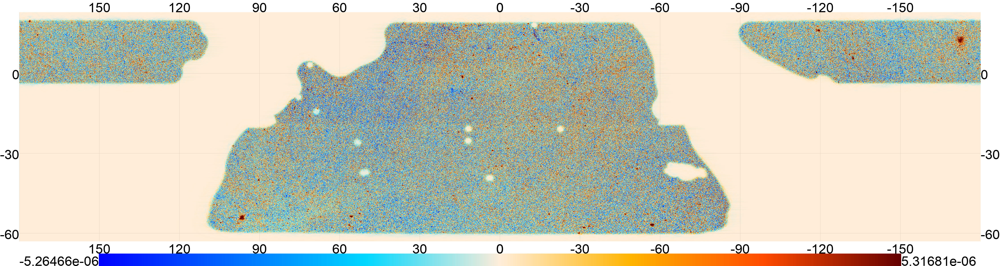

In [5]:
# Define a function to plot the map
def eshow(x,**kwargs):
    ''' Define a function to help us plot the maps neatly '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = "ipython")
# show the map (downgraded to save time and memory)
eshow(ymap, downgrade=10, ticks=30, colorbar=True, font_size=60)

Now, let's get a publicly-available cluster list and take a look at a few clusters in our map area.

In [6]:
# Load in a small list of clusters with redshifts from public data (DES Y1)
!wget -O redmapper_y1a1_public_v6.4_catalog.fits.gz https://desdr-server.ncsa.illinois.edu/despublic/y1a1_files/redmapper/redmapper_y1a1_public_v6.4_catalog.fits.gz
hdu = fits.open("redmapper_y1a1_public_v6.4_catalog.fits.gz")
clusters = hdu[1].data
hdu.close()

# let's just look at massive, low-z clusters for now: these are easy to see in the y map
richness = clusters['LAMBDA']
z  = clusters['Z_LAMBDA']
min_rich = 20
rich     = richness>min_rich
maxz     = 0.5
zrange   = z < maxz
keep     = rich & zrange

# cut the clusters to those within the chosen richness and redshift range
richness = richness[keep]
ra = clusters['RA'][keep]
dec = clusters['DEC'][keep]
z = z[keep]
ncl = len(ra)
print("Number of clusters:", ncl)

--2024-04-18 13:04:01--  https://desdr-server.ncsa.illinois.edu/despublic/y1a1_files/redmapper/redmapper_y1a1_public_v6.4_catalog.fits.gz
Resolving desdr-server.ncsa.illinois.edu (desdr-server.ncsa.illinois.edu)... 149.165.153.121
Connecting to desdr-server.ncsa.illinois.edu (desdr-server.ncsa.illinois.edu)|149.165.153.121|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2157326 (2.1M) [application/gzip]
Saving to: ‘redmapper_y1a1_public_v6.4_catalog.fits.gz’

redmapper_y1a1_publ 100%[===================>]   2.06M  --.-KB/s    in 0.1s    

2024-04-18 13:04:01 (17.3 MB/s) - ‘redmapper_y1a1_public_v6.4_catalog.fits.gz’ saved [2157326/2157326]

Number of clusters: 3908


In [7]:
# Define a function to show on the map where the clusters are:
def mask_srcs(shape,wcs,srcs_deg,radius_arcmin):
    """
    from orphics.maps by Mathew S. Madhavacheril
    Create a mask of circular holes in rectangular pixelization given
    a set of coordinates and a hole radius.

    Parameters
    ----------
    shape : tuple
        Shape of the output mask to be generated.
    wcs : `astropy.wcs.WCS`
        WCS object describing the output mask.
    srcs_deg : float `numpy.ndarray` of shape (2, Nobj)
        An array of Nobj coordinates in (Dec,RA) order and in degrees.
    radius_arcmin : float
        The radius of the circular hole to mask with zeros at each
        object location.

    Returns
    -------
    mask : `pixell.enmap.ndmap`
        A boolean pixell enmap with geometry (shape,wcs) and False
        inside the circular holes and True outside.

    """
    r = np.deg2rad(radius_arcmin/60.)
    return enmap.distance_from(shape,wcs,np.deg2rad(srcs_deg), rmax=r) >= r

In [8]:
cluster_visual = mask_srcs(mask.shape,mask.wcs,np.asarray((dec,ra)),10.)

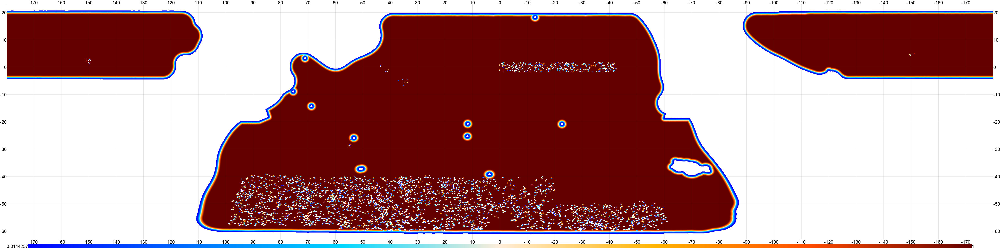

In [9]:
# show the clusters and where they are in relation to the ACT y mask
eshow(cluster_visual*mask, downgrade = 10, ticks=10, colorbar=True, mask = 0)


**Find out if our objects are near the edge of the y mask**

From the above image we can see that some clusters lie very close to the mask edges. We may not want to include cutouts centered on objects near the edge of the mask, as the outskirts will include unphysical structure (or lack thereof)

In [10]:
# limit clusters to no closer than 2 degrees from the footprint edges
include_idx = np.arange(ncl)
cls_overlap = []
height,width = enmap.pixshape(mask.shape,mask.wcs) #height and width of pixels in radians
print(height,width)
npix_from_edge_x = np.deg2rad(2)//width # Set distance from edge of footprint here (currently 2 deg)
npix_from_edge_y = np.deg2rad(2)//height # and here
print("Avoiding this many pixels from the mask edges / holes (x,y):", npix_from_edge_x, npix_from_edge_y)
for i_cl in range(ncl):
    coords = np.deg2rad(np.array((dec[i_cl],ra[i_cl])))
    ypix, xpix = enmap.sky2pix(mask.shape, mask.wcs, coords)
    left   = int(xpix - npix_from_edge_x)
    right  = int(xpix + npix_from_edge_x + 1)
    bottom = int(ypix - npix_from_edge_y)
    top    = int(ypix + npix_from_edge_y + 1)
    # Make a box of the mask values in the cutout around the cluster
    maski = mask[bottom:top, left:right]
    # check if the mean is low enough to indicate this is near the edge
    if maski.size == 0:
        mean = 0.
    else:
        mean = np.mean(maski)
    if mean<1: # this number can be fiddled with to get further or closer to the edges
        continue
    else:
        cls_overlap.append(include_idx[i_cl])

richness_masked=richness[cls_overlap]
ra_masked=ra[cls_overlap]
dec_masked=dec[cls_overlap]
z_masked=z[cls_overlap]
print("Number of clusters remaining:", len(z_masked))

0.00014544410433286022 0.00012419609722938644
Avoiding this many pixels from the mask edges / holes (x,y): 281.0 240.0
Number of clusters remaining: 3429


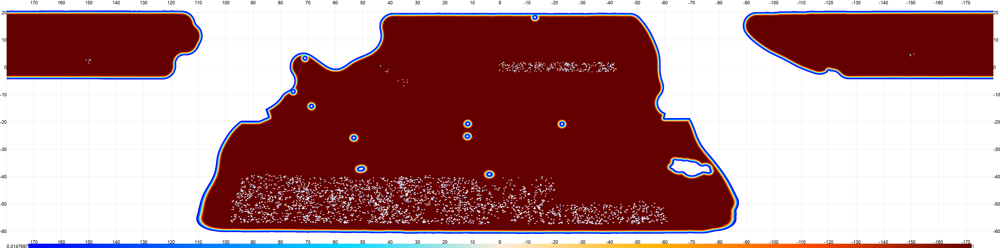

In [11]:
# plot the cluster locations after removing clusters near the edge
cluster_visual_masked = mask_srcs(mask.shape,mask.wcs,np.asarray((dec_masked,ra_masked)),10.)
eshow(cluster_visual_masked * mask, downgrade = 10, ticks=10, colorbar=True, mask = 0)

We see that the cluster locations are now well within the mask boundaries.

**Take cutouts around some clusters**

Let's look at a few of the clusters. Those which are both high-richness and at low redshifts are more visible in the map.

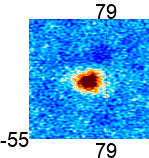

area in steradians 0.00017687195599944123
Size in pixels: 14400
Richness of this cluster:  195.06956
Redshift of this cluster:  0.30416065
RA, Dec [deg]= 79.2, -54.5


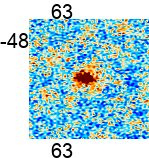

area in steradians 0.00020252237861743413
Size in pixels: 14400
Richness of this cluster:  174.4601
Redshift of this cluster:  0.41936922
RA, Dec [deg]= 62.8, -48.3


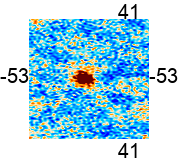

area in steradians 0.00018316175023896396
Size in pixels: 14400
Richness of this cluster:  146.2384
Redshift of this cluster:  0.30112934
RA, Dec [deg]= 41.4, -53.0


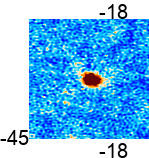

area in steradians 0.00021718810633521344
Size in pixels: 14400
Richness of this cluster:  178.83827
Redshift of this cluster:  0.3514858
RA, Dec [deg]= 342.2, -44.5


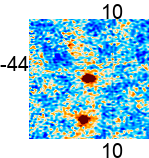

area in steradians 0.00021861221305316398
Size in pixels: 14400
Richness of this cluster:  139.17534
Redshift of this cluster:  0.3678793
RA, Dec [deg]= 10.2, -44.1


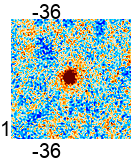

area in steradians 0.0003045220811892312
Size in pixels: 14400
Richness of this cluster:  135.48364
Redshift of this cluster:  0.24008219
RA, Dec [deg]= 323.8, 1.4


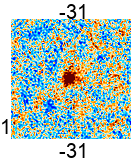

area in steradians 0.0003045242396457859
Size in pixels: 14400
Richness of this cluster:  136.20062
Redshift of this cluster:  0.22623187
RA, Dec [deg]= 329.0, 1.4


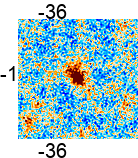

area in steradians 0.0003045619973523125
Size in pixels: 14400
Richness of this cluster:  141.08221
Redshift of this cluster:  0.32642642
RA, Dec [deg]= 323.8, -1.0


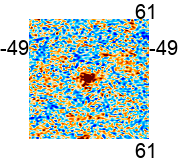

area in steradians 0.00019875554625960255
Size in pixels: 14400
Richness of this cluster:  140.34998
Redshift of this cluster:  0.29782504
RA, Dec [deg]= 61.5, -49.3


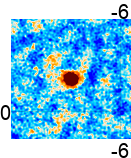

area in steradians 0.00030461015035663375
Size in pixels: 14400
Richness of this cluster:  129.00027
Redshift of this cluster:  0.27770245
RA, Dec [deg]= 354.4, 0.3


In [12]:
# view a couple cutouts around clusters with the same area in steradians
# The notebook https://github.com/ACTCollaboration/DR4_DR5_Notebooks/blob/master/Notebooks/Section_4_visualize_objects.ipynb
# is another good resource that goes over some of these operations in more detail.

patch_size = 1 # degree
patches = []
Ncl_stack = 10 # number of clusters we will be examining and later stacking. Change this to stack more or fewer clusters
for i in range(Ncl_stack):
  # First we need to define our coordinates and radius in radians (utils.degree converts degrees to radians)
  ra_i = ra_masked[i]*utils.degree # to radians
  dec_i = dec_masked[i] * utils.degree
  radius_ra  = patch_size/2. * utils.degree
  radius_dec = patch_size/2. * utils.degree
  # Next we create our submap by defining a box in coordinate space. This is one way to examine patches of the map.
  # Note, however, that although the patches will have equal size in pixels, they will NOT take up the same area on the sky
  # due to the distortion of the CAR map as we go towards the south pole
  imap_sub = ymap.submap([[dec_i - radius_dec, ra_i - radius_ra], [dec_i + radius_dec, ra_i + radius_ra]])
  # Visualize the map cutout
  plot = enplot.plot(imap_sub)
  enplot.show(plot)
  patches.append(imap_sub)
  # check the area in steradians of of the submapprint(imap.shape, imap.wcs)
  print("area in steradians", enmap.area(imap_sub.shape, imap_sub.wcs))
  print("Size in pixels:", imap_sub.size)
  print("Richness of this cluster: ", richness_masked[i])
  print("Redshift of this cluster: ", z_masked[i])
  print("RA, Dec [deg]= {:.1f}, {:.1f}".format(ra_masked[i], dec_masked[i]))

You may notice that the low-dec objects appear more stretched horizontally; this is due to the fact we are using a fixed width in RA and the convergence of RA lines by a factor of cos(dec) toward the south pole, on a sphere. The CAR map geometry is discussed more at https://pixell.readthedocs.io/en/latest/usage.html. CAR map pixels are equally-shaped but do not take up equal area. As we see by 'size in pixels' above, the patch size for a fixed height and width in Dec and RA units is always equal, but the sky area per patch is different, as we see in 'area in steradians'.

**3. Example Stacking**

Now let's stack ten clusters doing the proper reprojection at the coordinate of each cluster to take into account the sky geometry, then examine the stacked image and its radial profile.

We will use pixell's reproject.thumbnails function to take cutouts that are reprojected at the center of each cluster.

The "proj" keyword defines the type of projection; see [the pixell documentation](https://pixell.readthedocs.io/en/latest/_modules/pixell/reproject.html#) for more details. We will use the default. Necessarily, interpolation is done in the process.


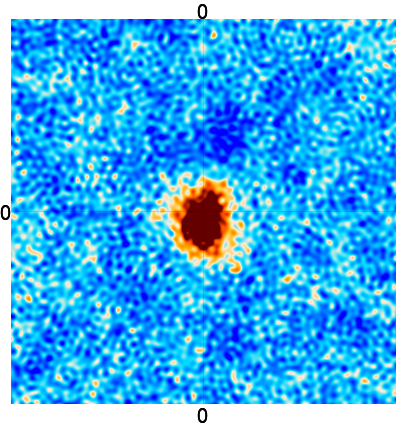

area in steradians 0.0003061040122461835
Size in pixels: 148225


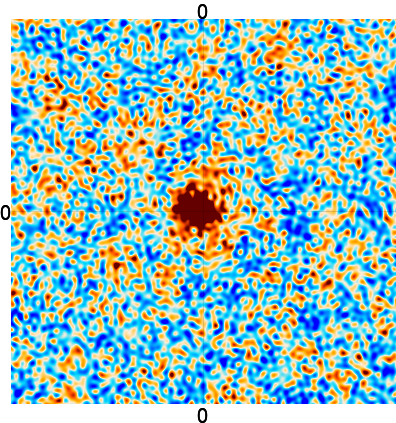

area in steradians 0.0003061040122461835
Size in pixels: 148225


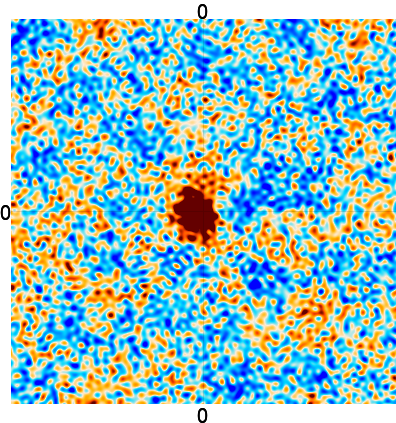

area in steradians 0.0003061040122461835
Size in pixels: 148225


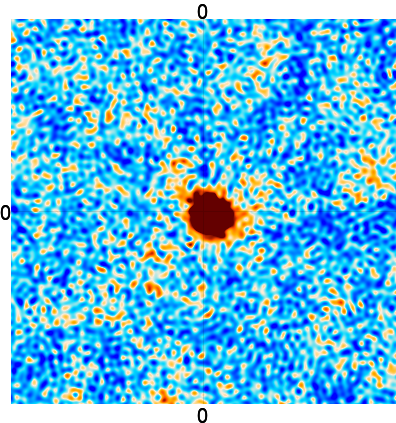

area in steradians 0.0003061040122461835
Size in pixels: 148225


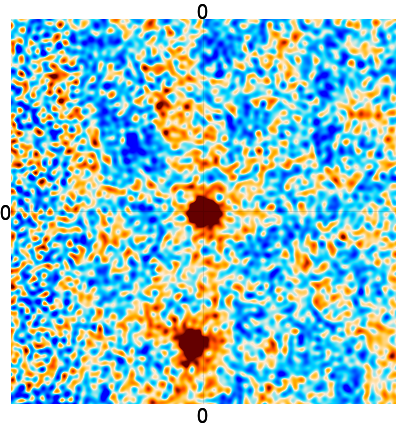

area in steradians 0.0003061040122461835
Size in pixels: 148225


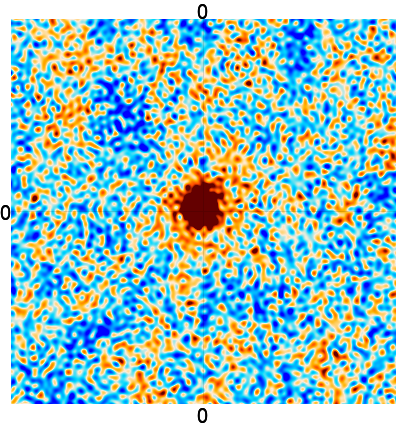

area in steradians 0.0003061040122461835
Size in pixels: 148225


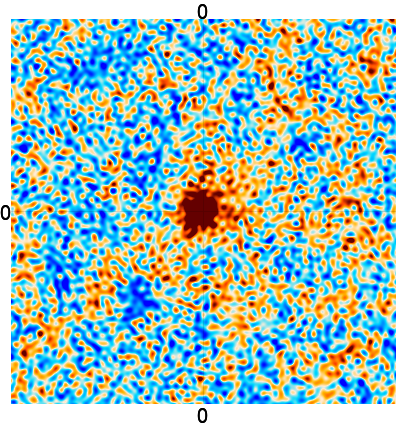

area in steradians 0.0003061040122461835
Size in pixels: 148225


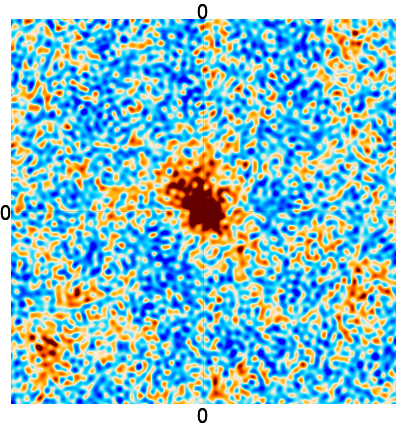

area in steradians 0.0003061040122461835
Size in pixels: 148225


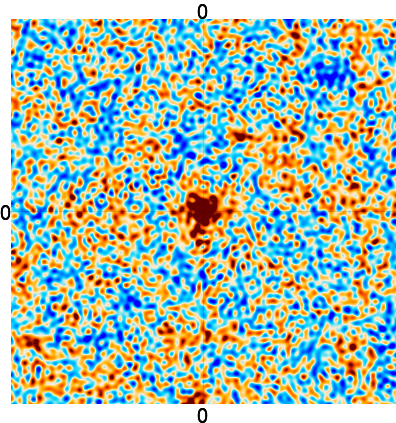

area in steradians 0.0003061040122461835
Size in pixels: 148225


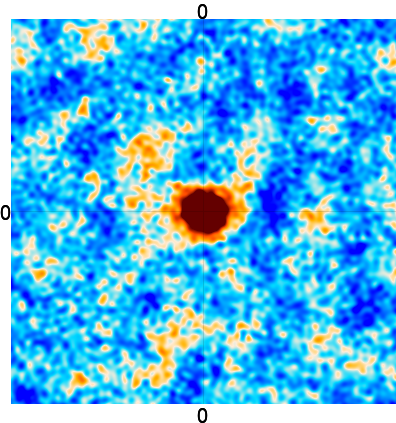

area in steradians 0.0003061040122461835
Size in pixels: 148225


In [13]:
Ncl_stack = 10 # stack only 10 clusters; increase this number if you want to stack more

# Set the size of the patches (also known as cutouts, stamps)
r = patch_size/2. * utils.degree  # convert previously defined radius in degrees to radians

# we will save our patches here. Reproject
patches_1x1deg = reproject.thumbnails(ymap, coords=np.deg2rad([dec_masked[:Ncl_stack],ra_masked[:Ncl_stack]]).T, res=0.0000454440, r=r)

# Visualize the map cutouts again
for p in patches_1x1deg:
  plot = enplot.plot(p)
  enplot.show(plot)
  # check the area in steradians of of the submap
  print("area in steradians", enmap.area(p.shape, p.wcs))
  print("Size in pixels:", p.size)

Now we have the same area in steradians *and* same size in pixels, and we no longer see distortion due to the reprojection. These can now be easily stacked!

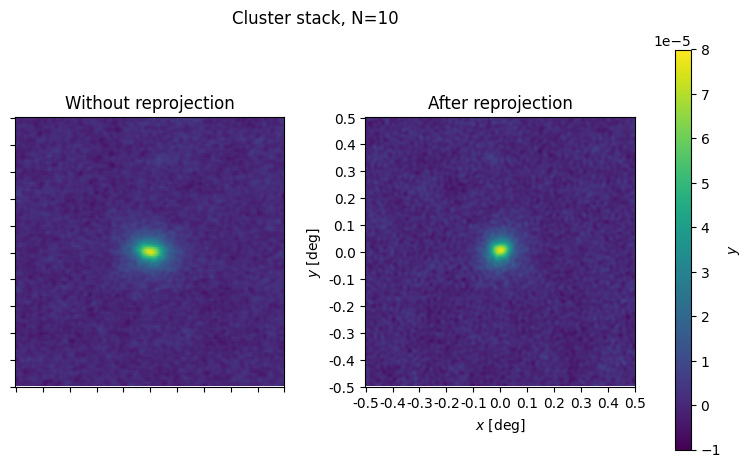

In [14]:
# make the stack by a simple average (a more complex analysis might use signal-to-noise weighting)
stack_1x1deg   = np.average(patches_1x1deg, axis=0)
# this is what it would have been if we hadn't reprojected
stack_noreproj = np.average(patches, axis=0)

# show the stack with and without reprojection
fig, ax = plt.subplots(ncols=2, figsize=[8,5])
ax[0].imshow(stack_noreproj, vmin=-1e-5, vmax=8e-5) # let's see it without reprojection
ystack = ax[1].imshow(stack_1x1deg, vmin=-1e-5, vmax=8e-5) # and with the reprojection

nticks = 11

ax[0].set_yticks(np.linspace(0, stack_noreproj.shape[0],nticks))
ax[1].set_yticks(np.linspace(0, stack_1x1deg.shape[0],nticks))
ax[0].set_xticks(np.linspace(0, stack_noreproj.shape[0],nticks))
ax[1].set_xticks(np.linspace(0, stack_1x1deg.shape[0],nticks))
ax[0].set_xticklabels("")
ax[0].set_yticklabels("")
ax[1].set_xticklabels("{:.1f}".format(tick) for tick in np.linspace(-patch_size/2., patch_size/2., nticks))
ax[1].set_yticklabels("{:.1f}".format(tick) for tick in np.linspace(patch_size/2., -patch_size/2., nticks))
ax[1].set_xlabel("$x$ [deg]")
ax[1].set_ylabel("$y$ [deg]")

ax[0].set_title("Without reprojection")
ax[1].set_title("After reprojection")
plt.suptitle(f"Cluster stack, N={Ncl_stack}")
# Create a new axis for the colorbar
cbar_ax = fig.add_axes([0.95, 0.1, 0.02, 0.8])  # [left, bottom, width, height]

# Add colorbar to the new axis
cbar = plt.colorbar(ystack, cax=cbar_ax)
cbar.set_label('$y$')
plt.subplots_adjust(wspace=.3)
plt.show()

Now, the stack looks much more symmetric than it would have if we had stacked the original cutouts.

Next, let us calculate the radial profile of the stack and compare it with the map's 1.6' beam.

In [15]:
# define a function to extract annuli
def get_annulus(image, r_in, r_out):

    '''
    Extract mean and std of image in annulus of radii (r_in, r_out)
    '''
    # creds: Huanian Zhang on Stackoverflow

    # define the image center
    # note that this works for images with odd npix but for even images the center is between two pixels
    # Also note that more precision one would may to account for pixel discreteness, doing some interpolation
    # or summing over partial pixels
    # (but we don't care about that level of precision for this tutorial)
    center = [int(image.shape[0]//2), int(image.shape[1]//2)]
    # define the possible maximum pixels in y and x (i and j) axes for the annulus between r_in and r_out
    imin = center[0] - r_out
    imax = center[0] + r_out + 1
    jmin = center[1] - r_out
    jmax = center[1] + r_out + 1
    target = []
    for i in np.arange(imin, imax):
        for j in np.arange(jmin, jmax):
            ij = np.array([i,j])
            # get the distance of pixel from center
            dist = np.linalg.norm(ij - np.array(center))
            # if the distance is within the annulus, save the y value in that pixel
            if dist > r_in and dist <= r_out:
                target.append(image[i][j])
    target = np.array(target)
    return np.average(target), np.std(target)

In [16]:
# bin in annuli.
# set the patch size and pixel size
patchsize_arcmin = patch_size*60
pixwidth_arcmin  = patch_size*60/stack_1x1deg.shape[0]
pix_bin = 2 # arbitrary choice of binning; increase this to bin more pixels together
print("Binning in annuli with width %f arcminutes" %(pix_bin * pixwidth_arcmin))
nbins = int(stack_1x1deg.shape[0]/2/pix_bin) # the radius of the image

sums_stack = []
errs_stack = []
bin_cents = []

for i in range(0, nbins-1): # moving out from the center in bin sizes of r_bin
    r_in = pix_bin * (i)
    r_out = r_in + pix_bin # outer radius of annulus
    bin_cent = (r_in+r_out)/2.
    i_per_a, err = get_annulus(stack_1x1deg, r_in, r_out)
    sums_stack.append(i_per_a)
    bin_cents.append(bin_cent)
    errs_stack.append(err)
errs_stack = np.asarray(errs_stack)
sums_stack = np.asarray(sums_stack)


Binning in annuli with width 0.311688 arcminutes


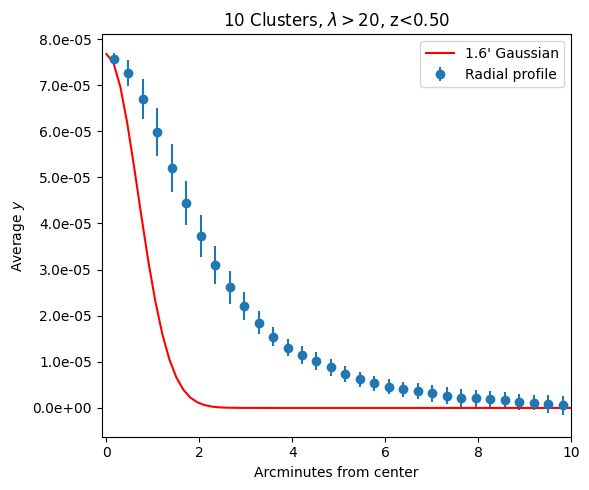

In [17]:
# plot the result
fig,ax = plt.subplots(figsize=[6,5])
ax.errorbar(np.asarray(bin_cents) * pixwidth_arcmin,sums_stack, yerr=errs_stack, label='Radial profile', fmt='o')
ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
ax.set_xlabel("Arcminutes from center")
ax.set_ylabel("Average $y$")
ax.set_title("%d Clusters, $\lambda>%.0f$, z<%.2f" %(Ncl_stack, min_rich, maxz))

# plot a gaussian also
xaxis_pix = np.linspace(0, stack_1x1deg.shape[0]//2, 200)
xaxis_arcmin = xaxis_pix * pixwidth_arcmin
sigma = 1.6/(2*np.sqrt(2 * np.log(2))) # beam in arcmin
amplitude = stack_1x1deg[stack_1x1deg.shape[1]//2,stack_1x1deg.shape[1]//2] # can fiddle with this by hand to try to get a matching profile
g = amplitude * np.exp(-(xaxis_arcmin)**2/(2*sigma**2))
ax.plot(xaxis_arcmin, g, 'r', label='1.6\' Gaussian')
ax.legend()
ax.set_xlim([-.1,10])
plt.tight_layout()

We see that the Gaussian beam is smaller than the cluster profile, which means that the structure of the stacked clusters extends further than the resolution of the ACT map.

So far, we have been combining clusters at quite different redshifts but neglecting how redshift impacts their angular size on the sky. Depending on the science case, we may want to rescale them to the same physical or comoving size.

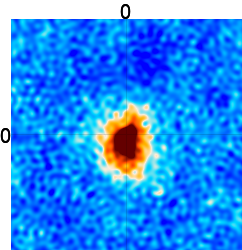

area in steradians 0.0001101983439436877
Size in pixels: 53361
Redshift 0.30416065


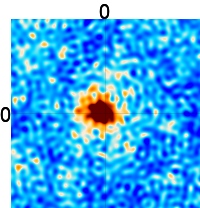

area in steradians 7.376925130793623e-05
Size in pixels: 35721
Redshift 0.41936922


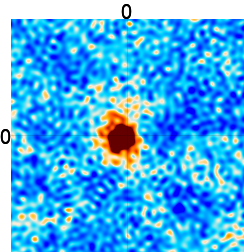

area in steradians 0.00011211479201353688
Size in pixels: 54289
Redshift 0.30112934


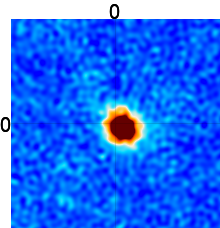

area in steradians 9.020778979522699e-05
Size in pixels: 43681
Redshift 0.3514858


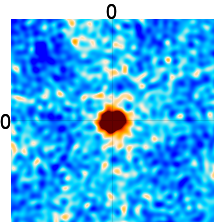

area in steradians 8.51027586456245e-05
Size in pixels: 41209
Redshift 0.3678793


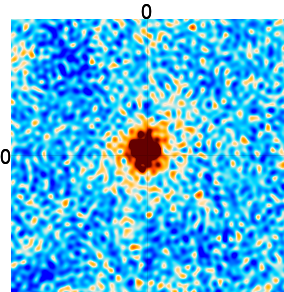

area in steradians 0.00015391310912630114
Size in pixels: 74529
Redshift 0.24008219


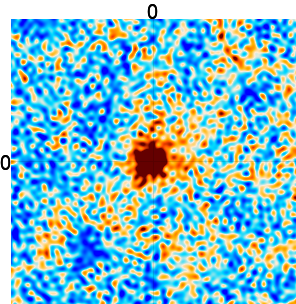

area in steradians 0.00016774121597785589
Size in pixels: 81225
Redshift 0.22623187


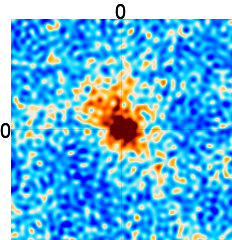

area in steradians 0.00010086391577928465
Size in pixels: 48841
Redshift 0.32642642


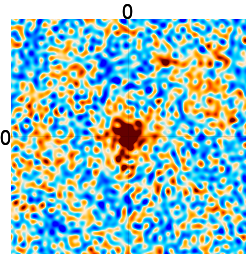

area in steradians 0.00011404776087739847
Size in pixels: 55225
Redshift 0.29782504


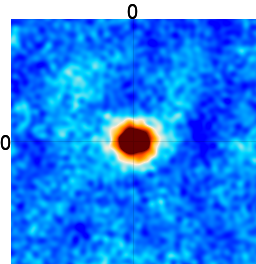

area in steradians 0.00012396041682507234
Size in pixels: 60025
Redshift 0.27770245


In [18]:
# Find the size in degree that corresponds to same physical size per redshift

import astropy.units as u
# choose the cosmology from Planck 2018
from astropy.cosmology import Planck18 as cosmo
from astropy.cosmology import z_at_value
L_Mpc = 10 # desired side length of each cutout in physical Mpc
# make an array of desired cutout sizes in degrees per cluster, corresponding to 10 Mpc at the cluster's redshift
patch_length_array = ((cosmo.arcsec_per_kpc_proper(z_masked).to(u.deg/u.Mpc))*L_Mpc*u.Mpc).value
# get the desired patch radius in radians
patch_r_array = patch_length_array/2. * utils.degree

patches_10x10Mpc = []
Ncl_stack = 10
for i in range(Ncl_stack):
  ra_i = ra_masked[i]*utils.degree # to radians
  dec_i = dec_masked[i] * utils.degree
  r = patch_r_array[i]
  # Next we create our cutouts by reprojecting around the cluster locations
  cutout = reproject.thumbnails(ymap, coords=np.deg2rad([dec_masked[i],ra_masked[i]]).T, res=0.0000454440, r=r)
  # Visualize the map cutout
  plot = enplot.plot(cutout)
  enplot.show(plot)
  patches_10x10Mpc.append(cutout)
  # check the area in steradians of of the submap
  print("area in steradians", enmap.area(cutout.shape, cutout.wcs))
  print("Size in pixels:", cutout.size)
  print("Redshift", z_masked[i])

The patches are all different sizes now, so we need to do some rescaling. This time we will use the Pillow Image package to do the interpolation.

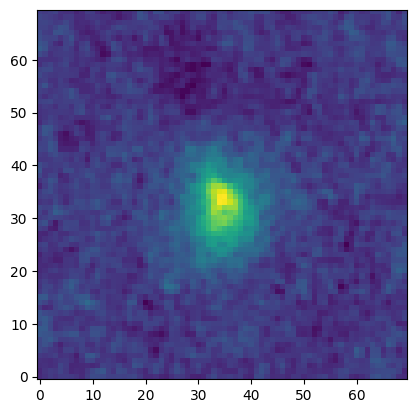

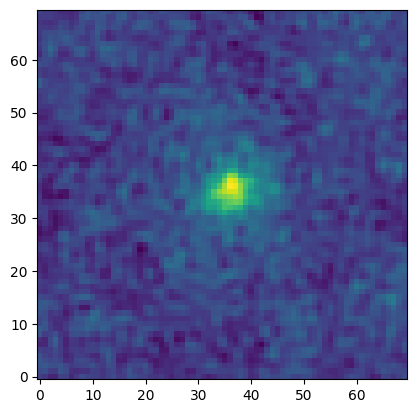

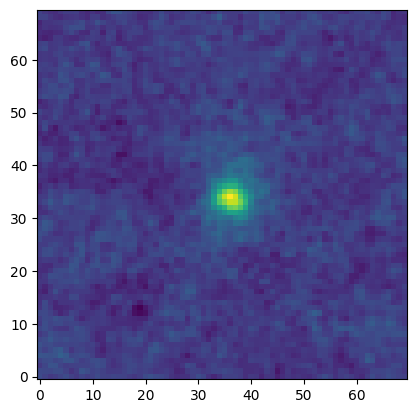

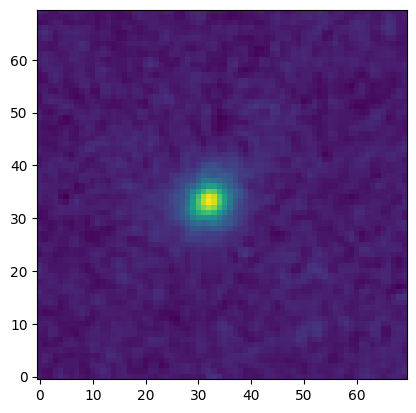

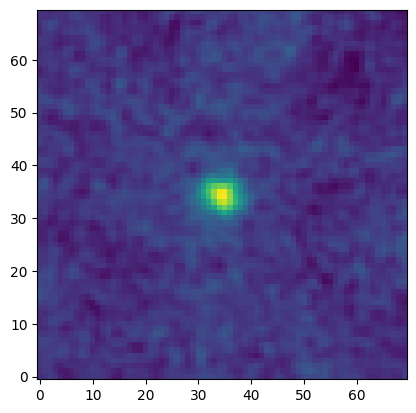

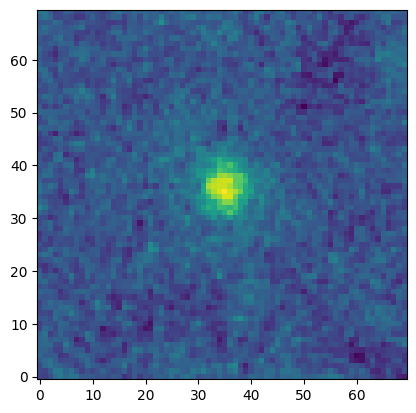

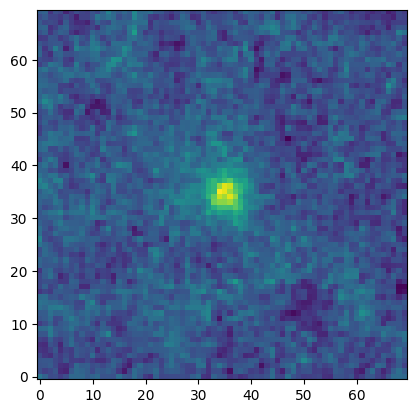

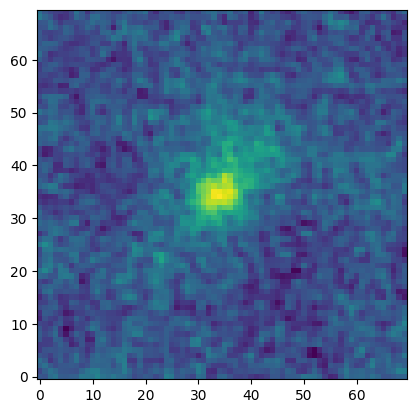

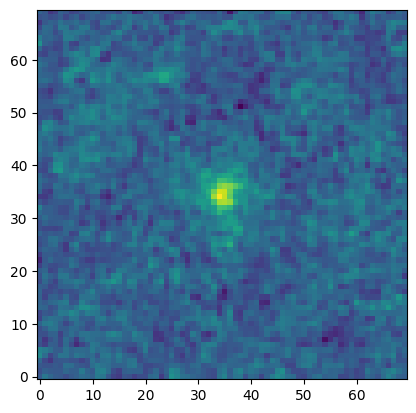

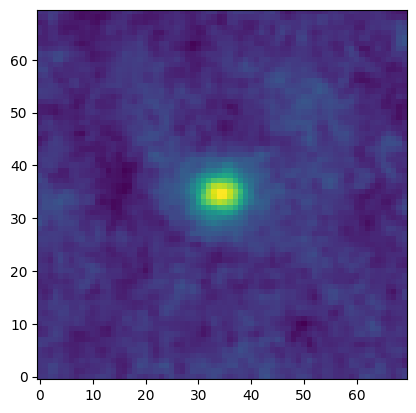

<Figure size 640x480 with 0 Axes>

In [19]:
im_array = []
base_shape = (70,70) # choose a square shape to interpolate to
for patch in patches_10x10Mpc:
  # Interpolate images to new size using Pillow.Image
  pil_img    = Image.fromarray(patch)
  # plt.imshow(pil_img)
  pil_img_rs = pil_img.resize(base_shape)
  resized    = np.array(pil_img_rs.getdata()).reshape(pil_img_rs.size)
  plt.imshow(np.fliplr(resized), origin = 'lower') # plot with the same orientation as the above enmap plots
  plt.show()
  plt.clf()
  im_array.append(resized)
im_array = np.asarray(im_array)
stack_interp = np.average(im_array, axis=0)

Text(0.5, 1.0, 'Constant-physical-size stack')

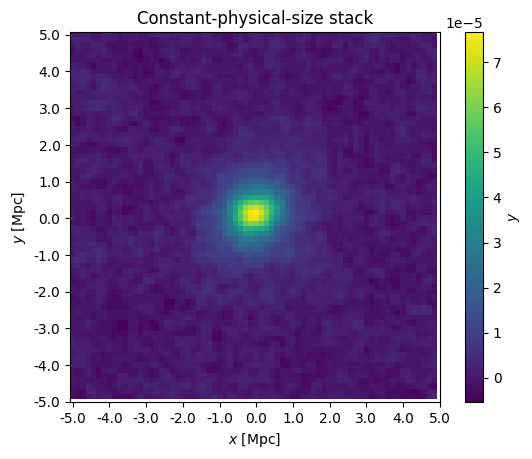

In [20]:
# show the stacked figure which has constant physical size
fig, ax = plt.subplots()
ystack2 = ax.imshow(stack_interp)
nticks = 11

ax.set_xticks(np.linspace(0, stack_interp.shape[1],nticks))
ax.set_yticks(np.linspace(0, stack_interp.shape[0],nticks))
ax.set_xticklabels("{:.1f}".format(tick) for tick in np.linspace(-L_Mpc/2., L_Mpc/2., nticks))
ax.set_yticklabels("{:.1f}".format(tick) for tick in np.linspace(L_Mpc/2., -L_Mpc/2., nticks))
ax.set_xlabel("$x$ [Mpc]")
ax.set_ylabel("$y$ [Mpc]")
plt.colorbar(ystack2, label='$y$')
plt.title("Constant-physical-size stack")

Next, let's look at the profile of these stacked clusters.

Binning in annuli with width 0.285714 Mpc


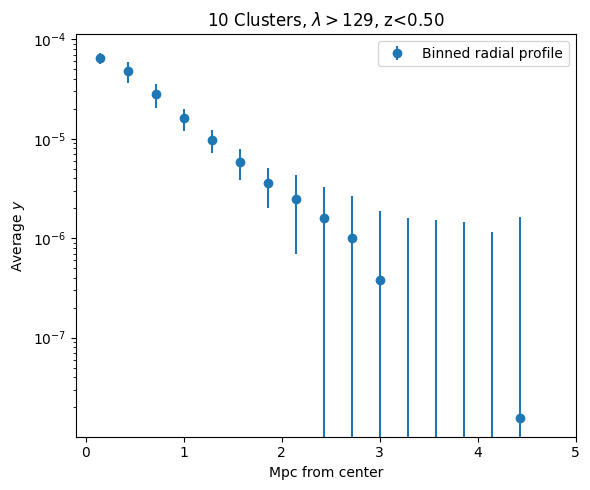

In [24]:
# bin in annuli

pixwidth_Mpc  = L_Mpc/stack_interp.shape[0] # pixheight is the same, since we made our base shape square
pix_bin = 2
print("Binning in annuli with width %f Mpc" %(pix_bin * pixwidth_Mpc))
nbins = int(stack_interp.shape[0]//2//pix_bin)
sums_stack = []
errs_stack = []
bin_cents = []
for i in range(0, nbins-1): #moving out from the center in bin sizes of r_bin
    r_in = pix_bin * (i)
    r_out = r_in + pix_bin #outer radius of annulus
    bin_cent = (r_in+r_out)/2.
    i_per_a, err = get_annulus(stack_interp, r_in, r_out)
    sums_stack.append(i_per_a)
    bin_cents.append(bin_cent)
    errs_stack.append(err)
errs_stack = np.asarray(errs_stack)
sums_stack = np.asarray(sums_stack)
fig,ax = plt.subplots(figsize=[6,5])
ax.errorbar(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack, yerr=errs_stack, label='Binned radial profile', fmt='o')

ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
ax.set_xlabel("Mpc from center")
ax.set_ylabel("Average $y$")
ax.set_title("%d Clusters, $\lambda>%d$, z<%.2f" %(Ncl_stack, np.amin(richness_masked[:Ncl_stack]), maxz))

# plot a gaussian also

xaxis_pix = np.linspace(0, stack_interp.shape[0]//2, 200)
xaxis_Mpc = xaxis_pix * pixwidth_Mpc
ax.legend()
ax.set_xlim([-.1,5])
plt.yscale('log') #toggle this to see in log scale or linear scale
plt.tight_layout()


Now, let's compare the signal-to-noise in the stacked image with that of a few individual images.

Noise in stack is on average 0.44 times that of the individual images. We expect 0.32


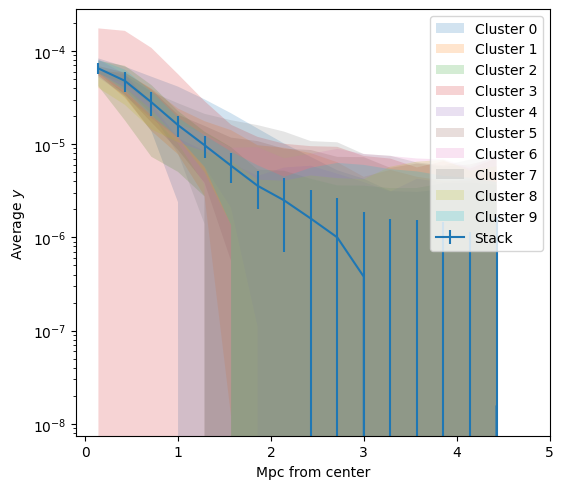

In [25]:
fig,ax = plt.subplots(figsize=[6,5])

noise_ratio = []
# find the profile (with uncertainties) for each different cluster cutout, so that we can compare it to the profile of the stacked image
for c, img in enumerate(im_array): # use the resized images
  sums = []
  errs = []
  bin_cents = []
  for i in range(0, nbins-1): #moving out from the center in bin sizes of r_bin
      r_in = pix_bin * (i)
      r_out = r_in + pix_bin #outer radius of annulus
      bin_cent = (r_in+r_out)/2.
      i_per_a, err = get_annulus(img, r_in, r_out)
      sums.append(i_per_a)
      bin_cents.append(bin_cent)
      errs.append(err)
  sums = np.asarray(sums)
  errs = np.asarray(errs)
  noise_ratio.append(np.average(errs_stack/errs))
  ax.fill_between(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack-errs, sums+errs, label=f'Cluster {c}', alpha = 0.2)
  ax.set_xlabel("Mpc from center")
  ax.set_ylabel("Average $y$")

ax.errorbar(np.asarray(bin_cents) * pixwidth_Mpc,sums_stack, yerr=errs_stack, label='Stack')
ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))

ax.legend()
ax.set_xlim([-.1,5])
plt.tight_layout()
plt.yscale('log')

print("Noise in stack is on average {:.2f} times that of the individual images. We expect {:.2f}".format(np.average(noise_ratio), 1/np.sqrt(Ncl_stack)))

With a larger number of clusters stacked, and more similar masses/richnesses, the expected $\sqrt{N}$ behavior will more accurately predict the true signal-to-noise scaling.

Stacks like this can be used to measure cluster (or galaxy) profiles in different mass ranges, environments, etc so that we can learn more about the intracluster medium as well as the gas beyond halos. However, note that contamination from the cosmic infrared background (CIB) is important to consider in such studies, as it is correlated with clusters and galaxies, and can bias the results from tSZ! See our CIB notebook, ACT_DR6_ymap_CIB, available in the same notebook directory, for more information on how to measure and mitigate CIB impacts in your analysis.

**For More Information**

More examples of how to use Pixell and the ACT data products can be found in the [ACT DR4 and DR5 Notebooks](https://github.com/ACTCollaboration/DR4_DR5_Notebooks/tree/master), Pixell itself can be found [here](https://github.com/simonsobs/pixell/tree/master) and the full list of public ACT data is on [LAMBDA](https://lambda.gsfc.nasa.gov/product/act/).